# Import thư viện

In [ ]:
import cv2 
import numpy as np
import matplotlib.pyplot as TenSV

# Hàm hiển thị ảnh

In [7]:
def show_rgb(img, title=None, figsize=(6,6)):
    TenSV.figure(figsize=figsize)
    if img.ndim == 2:
        TenSV.imshow(img, cmap="gray")
    else:
        TenSV.imshow(img[:, :, ::-1])
    if title is not None:
        TenSV.title(title)
    TenSV.axis("off")
    TenSV.show()

def show_pair(img1, img2, title1="Original", title2="Result", figsize=(12,6), gray=False):
    TenSV.figure(figsize=figsize)
    TenSV.subplot(1, 2, 1)
    if gray:
        TenSV.imshow(img1, cmap="gray")
    else:
        TenSV.imshow(img1[:, :, ::-1])
    TenSV.title(title1)
    TenSV.axis("off")
    TenSV.subplot(1, 2, 2)
    if gray:
        TenSV.imshow(img2, cmap="gray")
    else:
        TenSV.imshow(img2[:, :, ::-1])
    TenSV.title(title2)
    TenSV.axis("off")
    TenSV.show()

# Đọc ảnh gốc

## 1. Đọc ảnh và hiển thị ban đầu

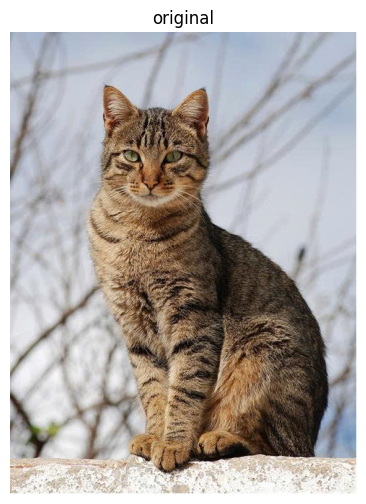

In [8]:
img = cv2.imread("hinh1.jpg")
show_rgb(img, "original")

## 2. Box Filter

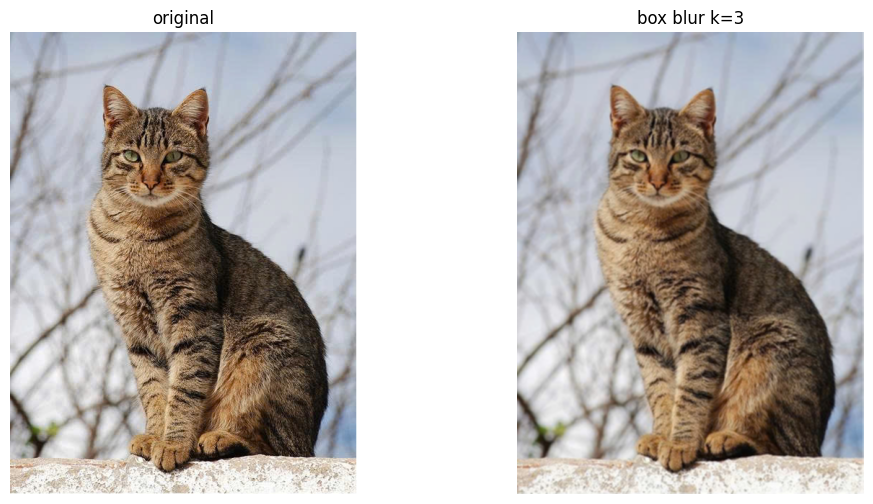

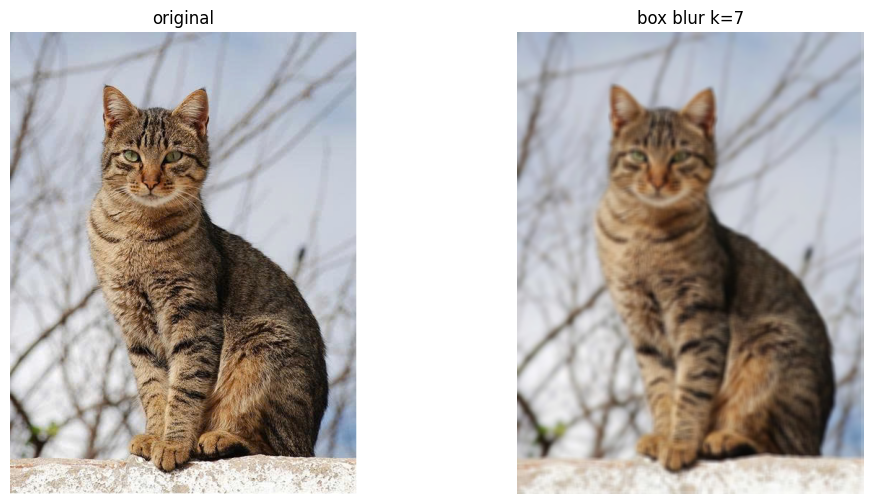

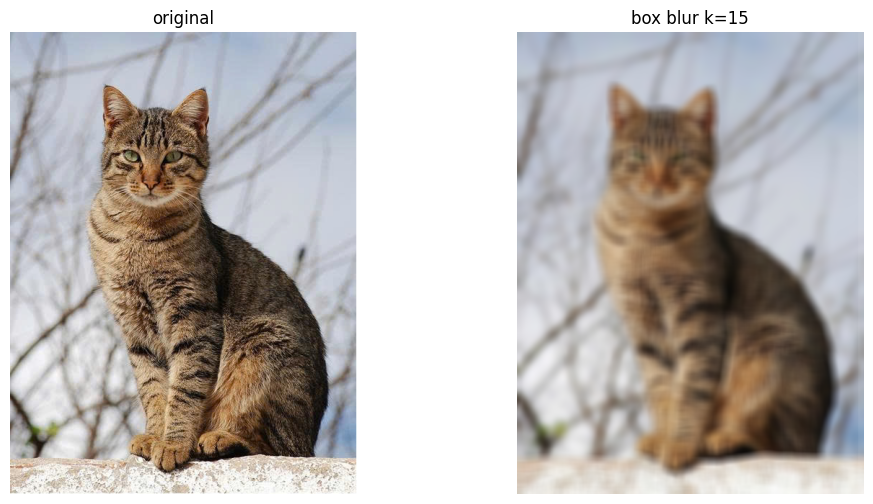

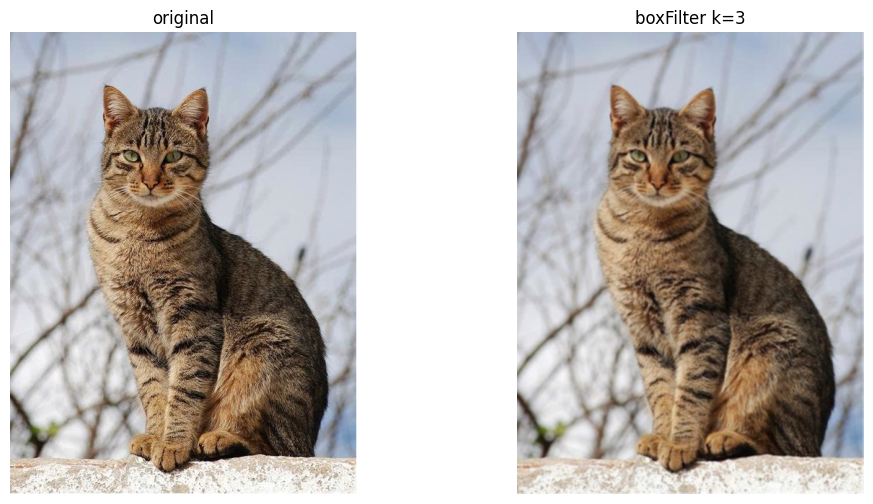

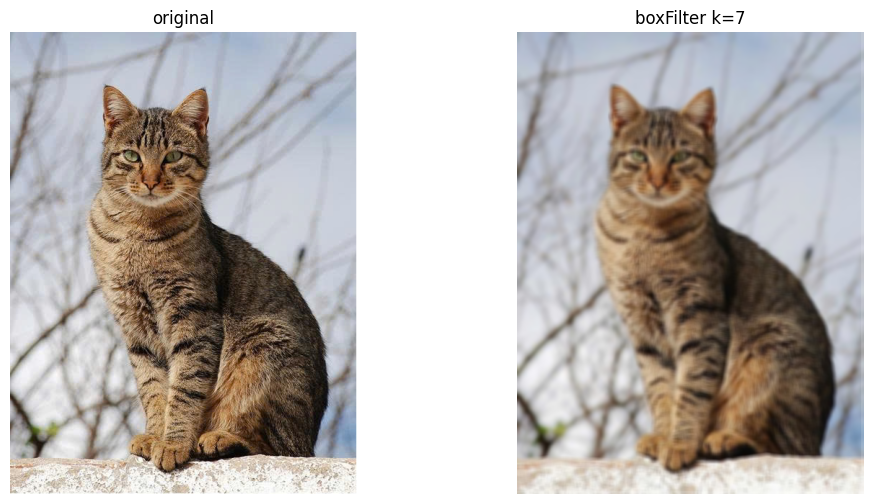

In [9]:
blur_3 = cv2.blur(img, (3,3))
blur_7 = cv2.blur(img, (7,7))
blur_15 = cv2.blur(img, (15,15))

show_pair(img, blur_3, "original", "box blur k=3")
show_pair(img, blur_7, "original", "box blur k=7")
show_pair(img, blur_15, "original", "box blur k=15")

box_3 = cv2.boxFilter(img, ddepth=-1, ksize=(3,3), normalize=True)
box_7 = cv2.boxFilter(img, ddepth=-1, ksize=(7,7), normalize=True)

show_pair(img, box_3, "original", "boxFilter k=3")
show_pair(img, box_7, "original", "boxFilter k=7")

## 3. Gaussian Filter

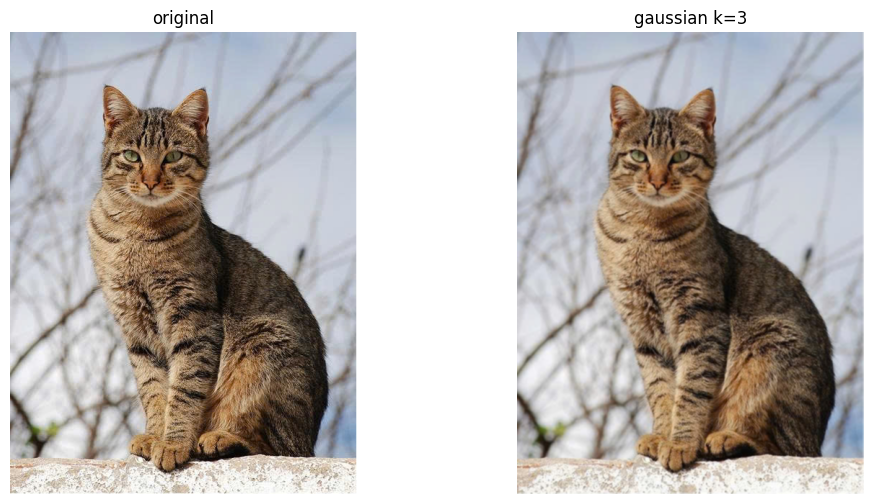

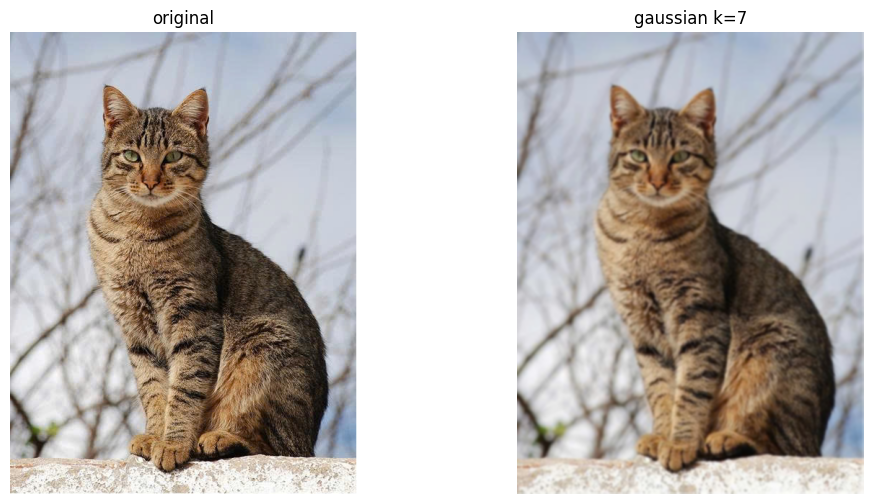

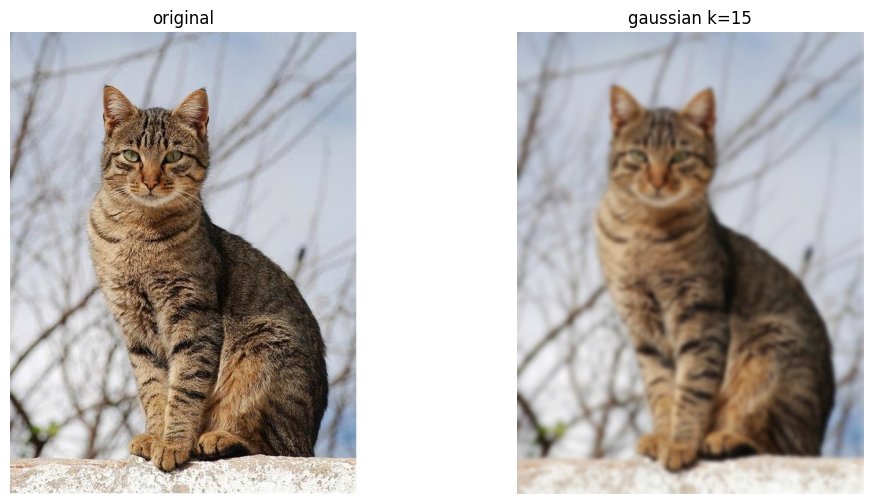

In [10]:
gauss_3 = cv2.GaussianBlur(img, (3,3), 0)
gauss_7 = cv2.GaussianBlur(img, (7,7), 0)
gauss_15 = cv2.GaussianBlur(img, (15,15), 0)

show_pair(img, gauss_3, "original", "gaussian k=3")
show_pair(img, gauss_7, "original", "gaussian k=7")
show_pair(img, gauss_15, "original", "gaussian k=15")

## 4. Median Filter

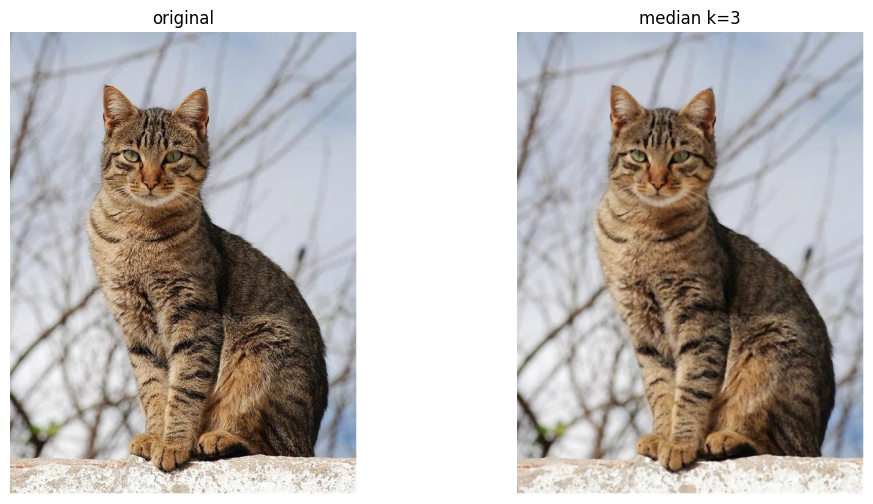

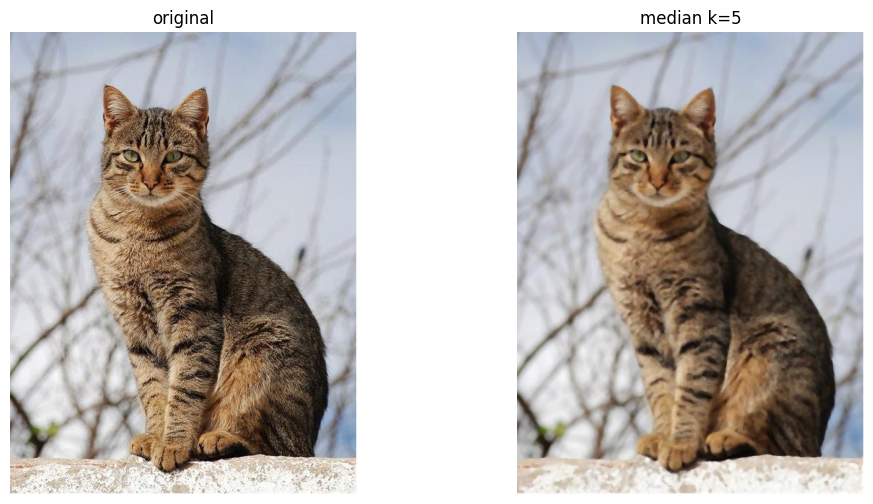

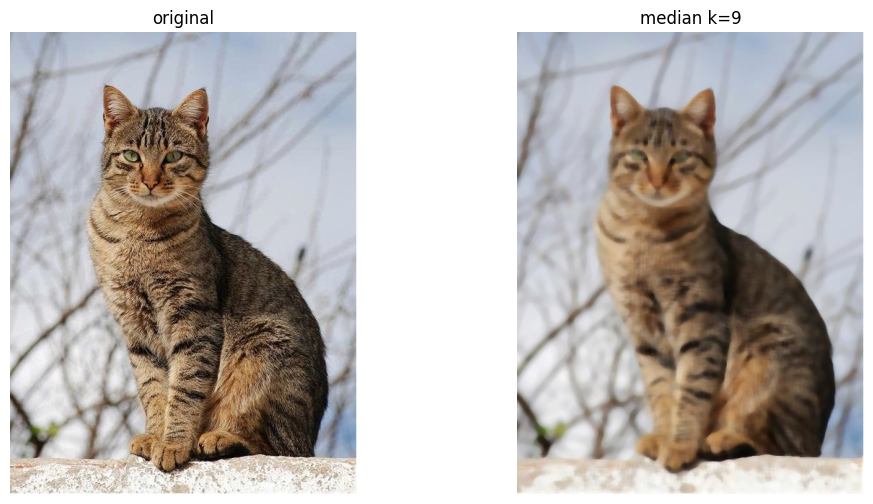

In [11]:
med_3 = cv2.medianBlur(img, 3)
med_5 = cv2.medianBlur(img, 5)
med_9 = cv2.medianBlur(img, 9)

show_pair(img, med_3, "original", "median k=3")
show_pair(img, med_5, "original", "median k=5")
show_pair(img, med_9, "original", "median k=9")

## 5. Lọc ảnh Pepper Noise

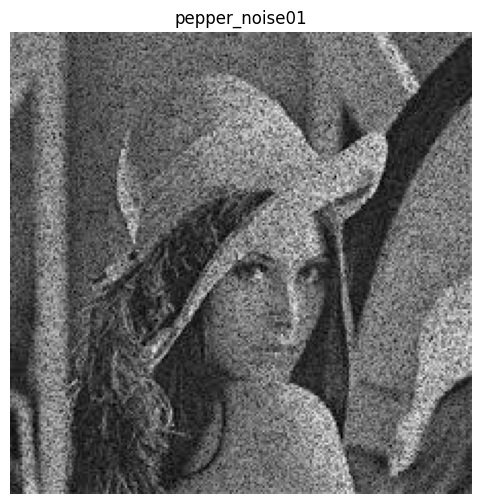

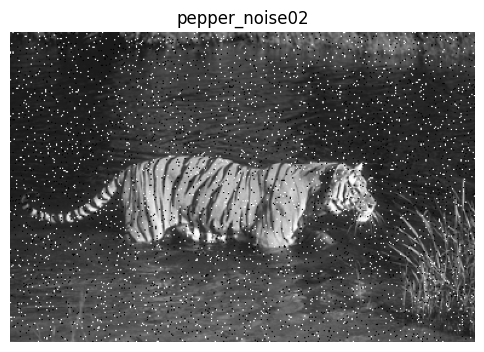

In [12]:
noise1 = cv2.imread("pepper_noise01.jpg")
noise2 = cv2.imread("pepper_noise02.png")

show_rgb(noise1, "pepper_noise01")
show_rgb(noise2, "pepper_noise02")

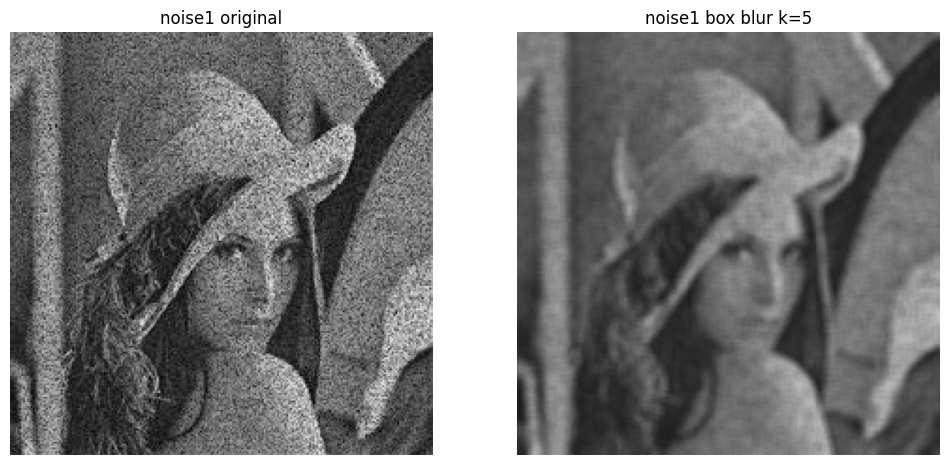

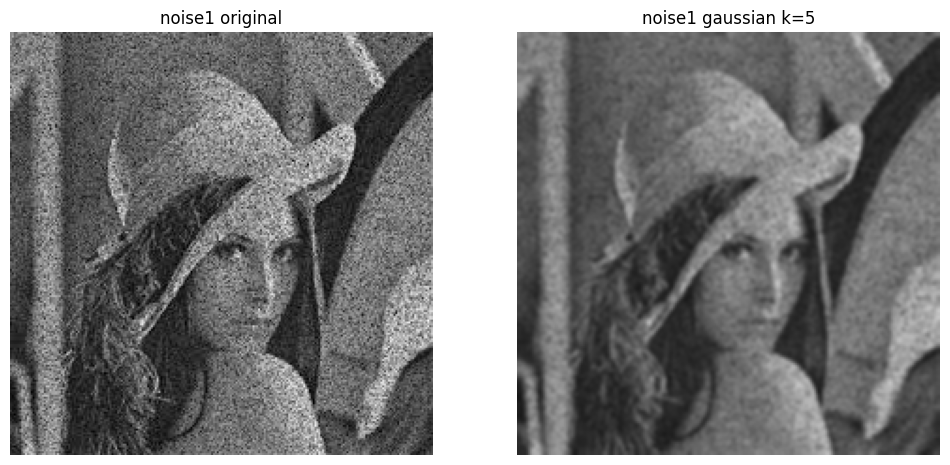

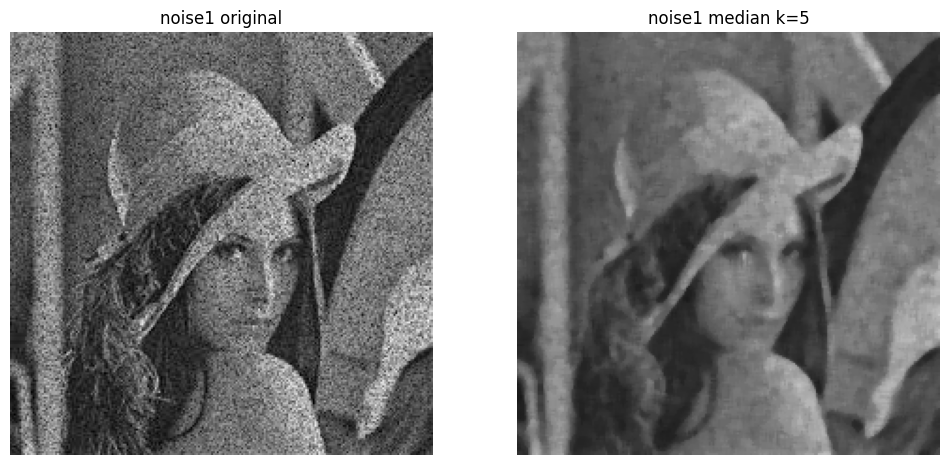

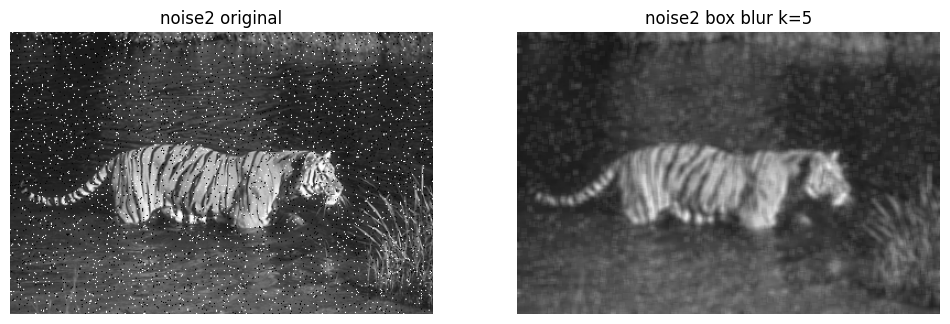

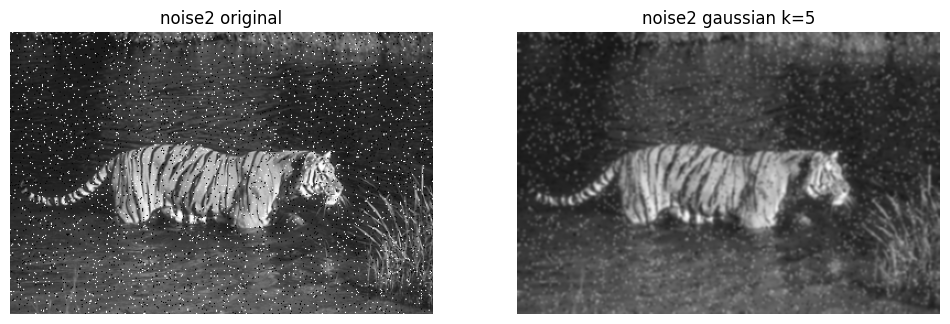

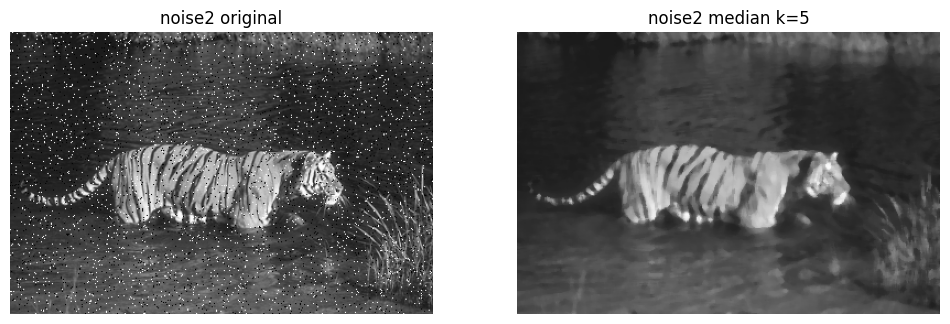

In [13]:
def run_filters_on_noise(noise_img, tag):
    b = cv2.blur(noise_img, (5,5))
    g = cv2.GaussianBlur(noise_img, (5,5), 0)
    m = cv2.medianBlur(noise_img, 5)
    show_pair(noise_img, b, f"{tag} original", f"{tag} box blur k=5")
    show_pair(noise_img, g, f"{tag} original", f"{tag} gaussian k=5")
    show_pair(noise_img, m, f"{tag} original", f"{tag} median k=5")

run_filters_on_noise(noise1, "noise1")
run_filters_on_noise(noise2, "noise2")

## 6. Cân bằng sáng – Equalize Histogram

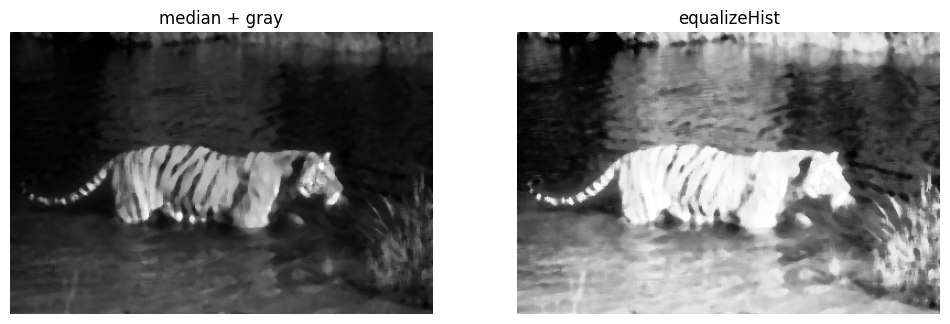

In [14]:
blur = cv2.medianBlur(noise2, 5)
gray = cv2.cvtColor(blur, cv2.COLOR_BGR2GRAY)
eq = cv2.equalizeHist(gray)

show_pair(gray, eq, "median + gray", "equalizeHist", gray=True)

## 7. Phép toán số học và logic – Tách Ball

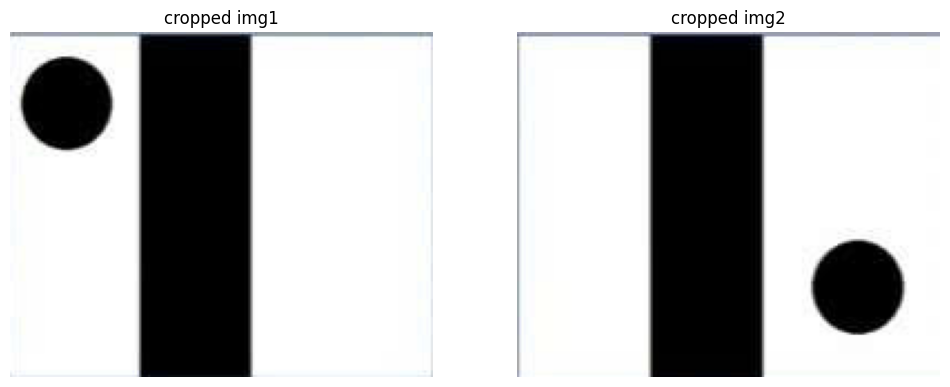

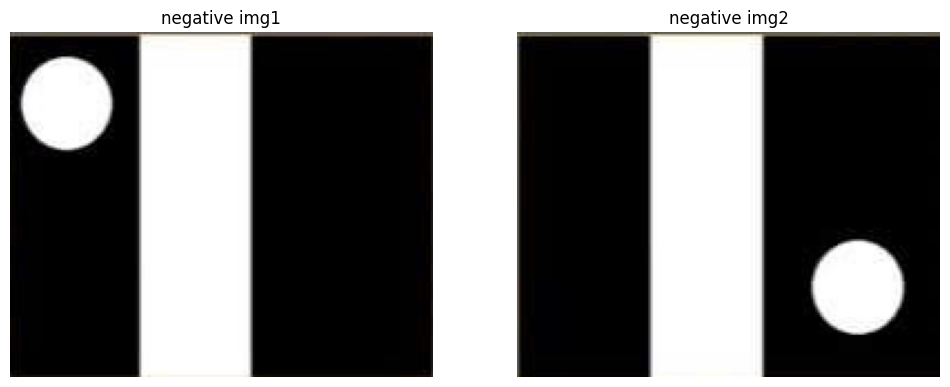

In [15]:
img1 = cv2.imread("hinh2.jpg")
img2 = cv2.imread("hinh3.jpg")

img1 = img1[:155, 1:191]
img2 = img2[:155, :190]

inv_img1 = cv2.bitwise_not(img1)
inv_img2 = cv2.bitwise_not(img2)

show_pair(img1, img2, "cropped img1", "cropped img2")
show_pair(inv_img1, inv_img2, "negative img1", "negative img2")

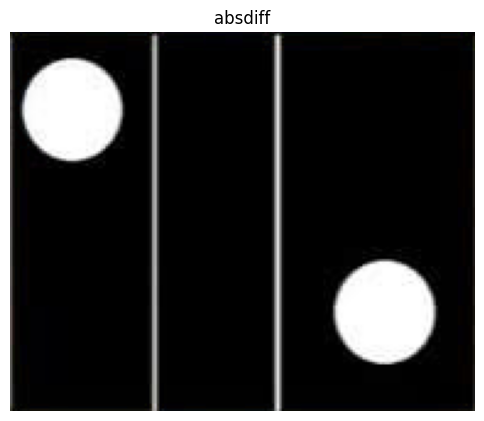

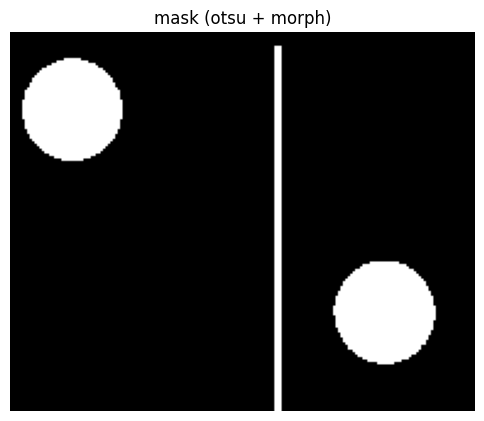

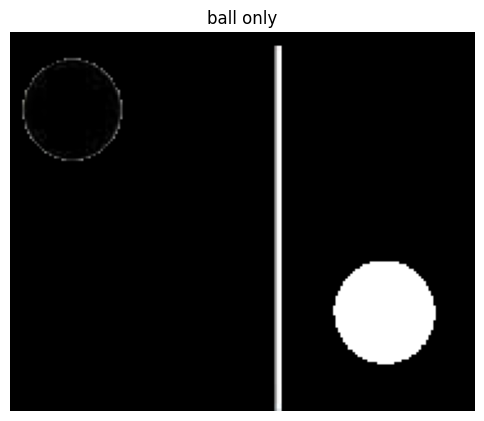

In [16]:
diff = cv2.absdiff(img1, img2)
diff_gray = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
_, mask = cv2.threshold(diff_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

kernel = np.ones((3,3), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=1)

ball = cv2.bitwise_and(img1, img1, mask=mask)

show_rgb(diff, "absdiff")
show_rgb(mask, "mask (otsu + morph)")
show_rgb(ball, "ball only")

# Bài tập mở rộng - Edge Detection & Hough Transform

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as TenSV

def show_rgb(img, title=None, figsize=(6,6)):
    TenSV.figure(figsize=figsize)
    if img.ndim == 2:
        TenSV.imshow(img, cmap="gray")
    else:
        TenSV.imshow(img[:, :, ::-1])
    if title is not None:
        TenSV.title(title)
    TenSV.axis("off")
    TenSV.show()

def show_pair(img1, img2, title1="Original", title2="Result", figsize=(12,6), gray=False):
    TenSV.figure(figsize=figsize)
    TenSV.subplot(1, 2, 1)
    if gray:
        TenSV.imshow(img1, cmap="gray")
    else:
        TenSV.imshow(img1[:, :, ::-1])
    TenSV.title(title1)
    TenSV.axis("off")
    TenSV.subplot(1, 2, 2)
    if gray:
        TenSV.imshow(img2, cmap="gray")
    else:
        TenSV.imshow(img2[:, :, ::-1])
    TenSV.title(title2)
    TenSV.axis("off")
    TenSV.show()

Đọc ảnh

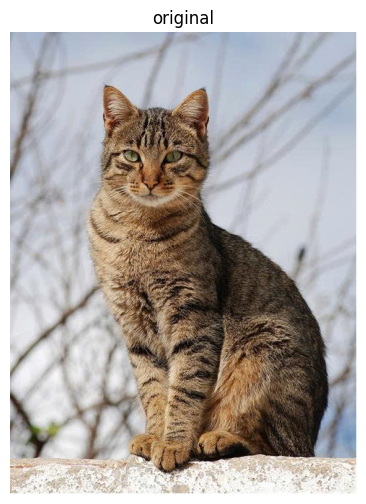

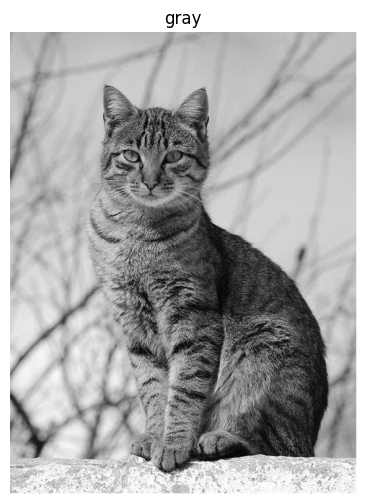

In [12]:
img_edge = cv2.imread("hinh1.jpg")
gray_edge = cv2.cvtColor(img_edge, cv2.COLOR_BGR2GRAY)
blur_edge = cv2.GaussianBlur(gray_edge, (5,5), 0)

show_rgb(img_edge, "original")
show_rgb(gray_edge, "gray")

1) Backward / Forward / Central gradient

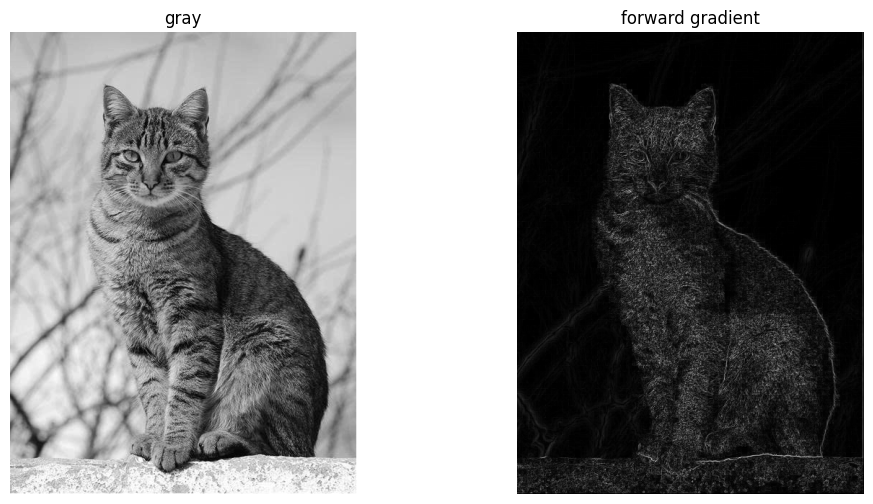

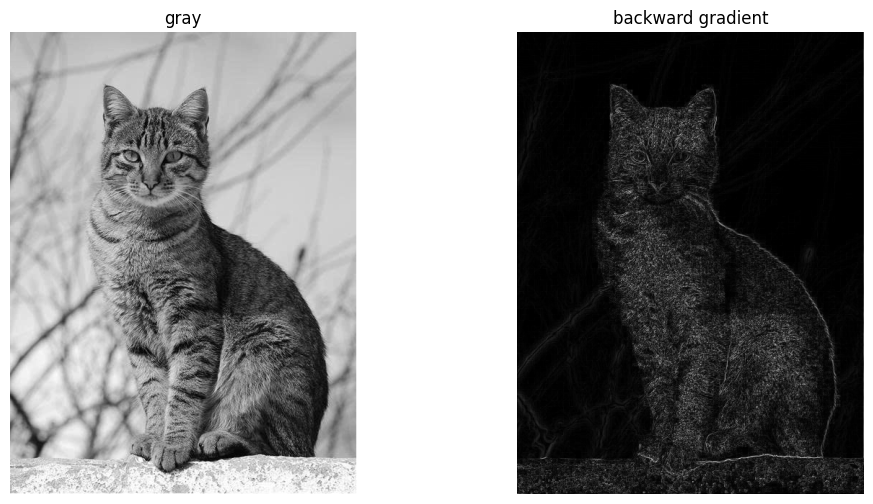

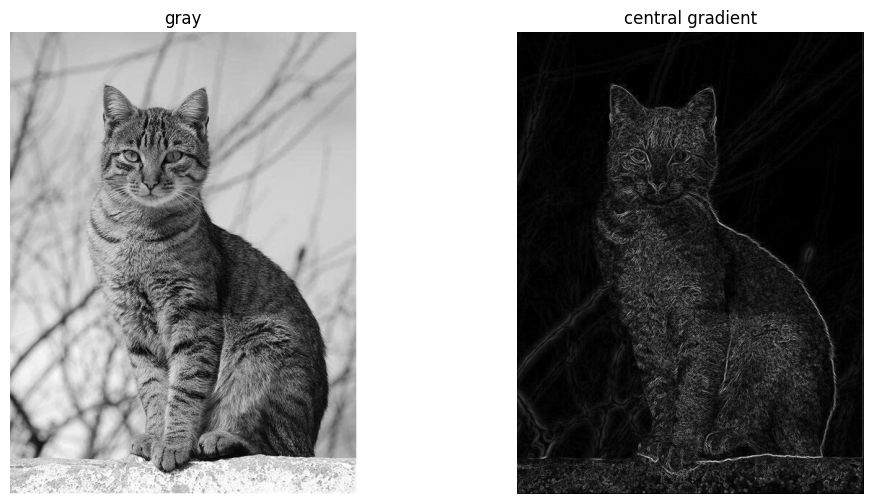

In [13]:
g = gray_edge.astype(np.float32)

fx = np.zeros_like(g)
bx = np.zeros_like(g)
cx = np.zeros_like(g)

fy = np.zeros_like(g)
by = np.zeros_like(g)
cy = np.zeros_like(g)

fx[:, :-1] = g[:, 1:] - g[:, :-1]
bx[:, 1:] = g[:, 1:] - g[:, :-1]
cx[:, 1:-1] = (g[:, 2:] - g[:, :-2]) / 2.0

fy[:-1, :] = g[1:, :] - g[:-1, :]
by[1:, :] = g[1:, :] - g[:-1, :]
cy[1:-1, :] = (g[2:, :] - g[:-2, :]) / 2.0

mag_f = cv2.convertScaleAbs(np.sqrt(fx**2 + fy**2))
mag_b = cv2.convertScaleAbs(np.sqrt(bx**2 + by**2))
mag_c = cv2.convertScaleAbs(np.sqrt(cx**2 + cy**2))

show_pair(gray_edge, mag_f, "gray", "forward gradient", gray=True)
show_pair(gray_edge, mag_b, "gray", "backward gradient", gray=True)
show_pair(gray_edge, mag_c, "gray", "central gradient", gray=True)

2) Finite difference filter

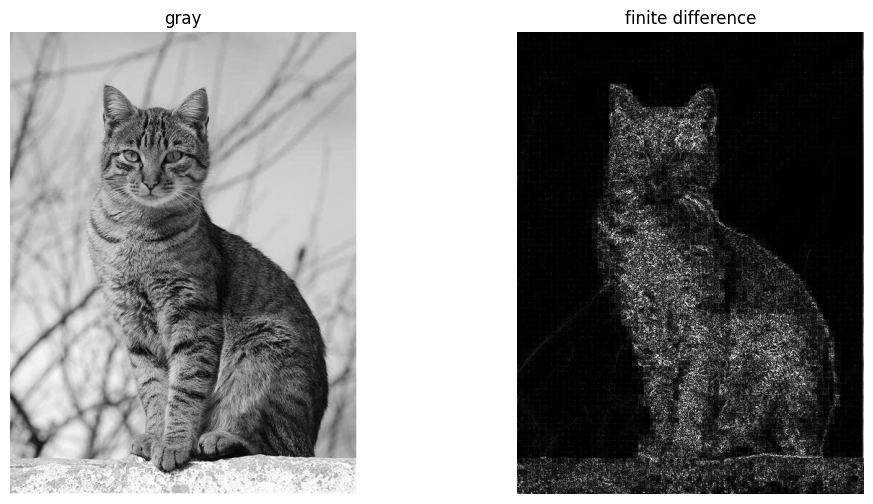

In [14]:
kernel_fd = np.array([[0, -1, 0],
                      [-1, 4, -1],
                      [0, -1, 0]], dtype=np.float32)

fd = cv2.filter2D(gray_edge, ddepth=cv2.CV_32F, kernel=kernel_fd)
fd_abs = cv2.convertScaleAbs(fd)

show_pair(gray_edge, fd_abs, "gray", "finite difference", gray=True)

3) Gaussian filter

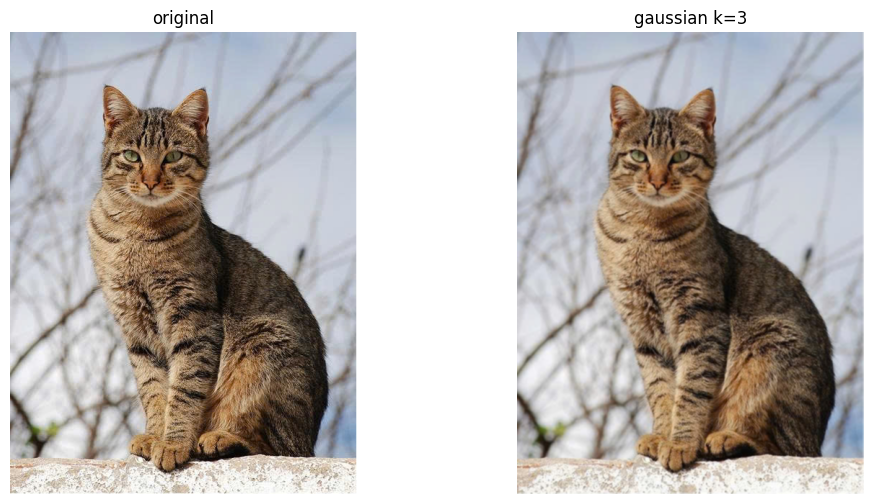

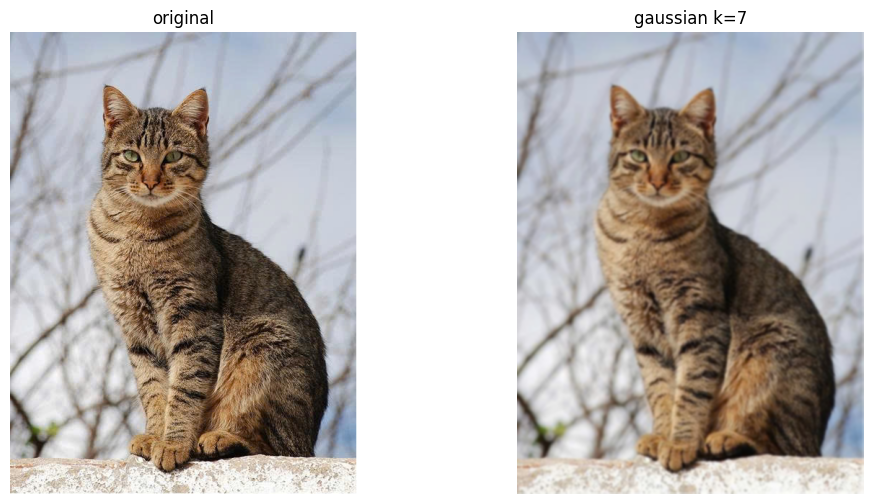

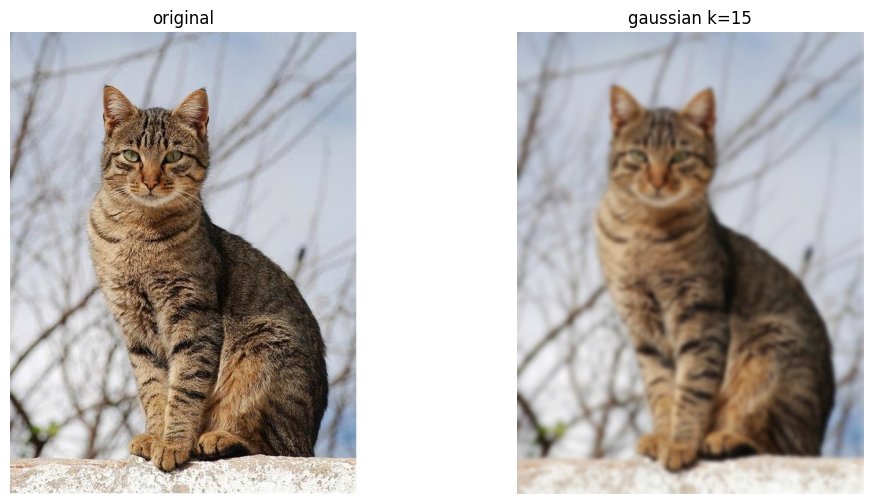

In [15]:
g3 = cv2.GaussianBlur(img_edge, (3,3), 0)
g7 = cv2.GaussianBlur(img_edge, (7,7), 0)
g15 = cv2.GaussianBlur(img_edge, (15,15), 0)

show_pair(img_edge, g3, "original", "gaussian k=3")
show_pair(img_edge, g7, "original", "gaussian k=7")
show_pair(img_edge, g15, "original", "gaussian k=15")

4) Sobel detector

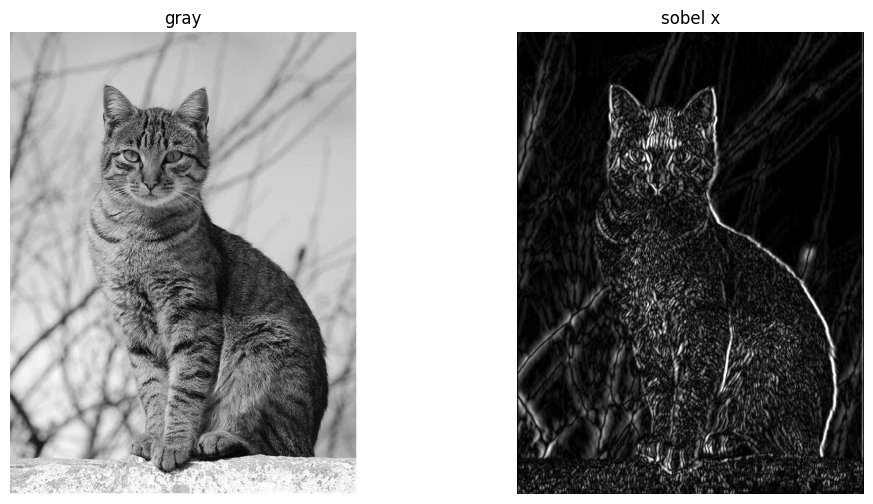

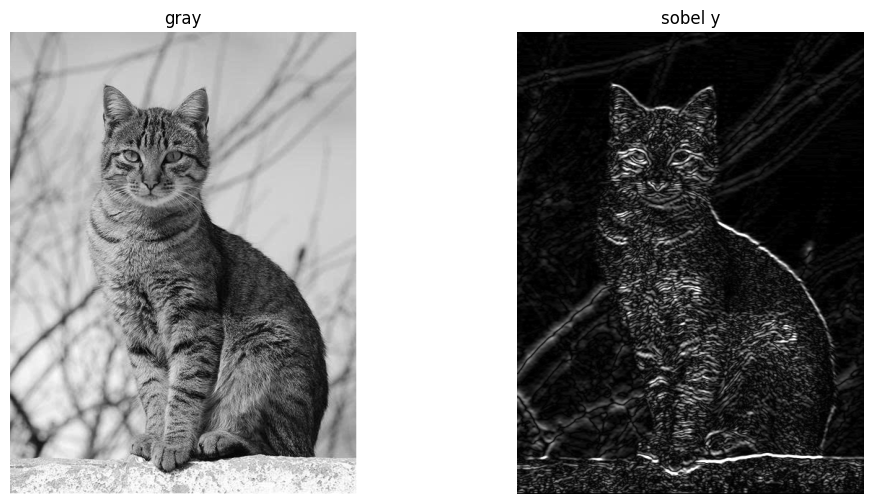

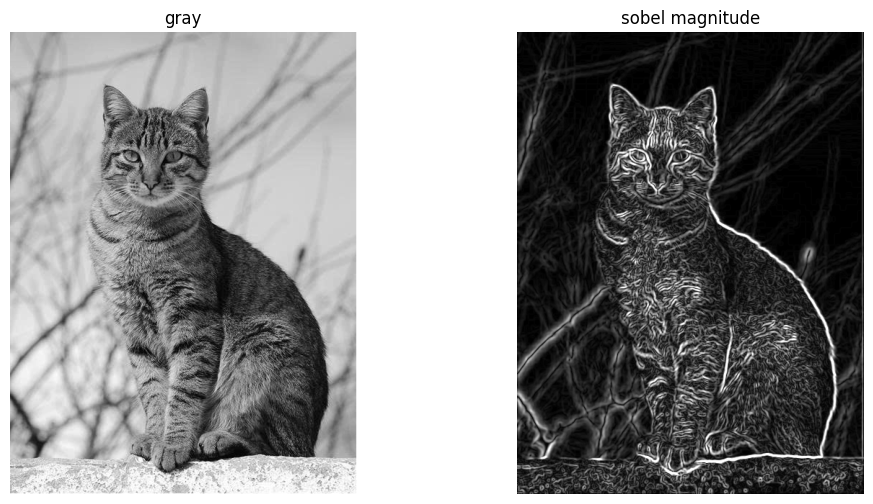

In [16]:
sx = cv2.Sobel(blur_edge, cv2.CV_64F, 1, 0, ksize=3)
sy = cv2.Sobel(blur_edge, cv2.CV_64F, 0, 1, ksize=3)
smag = cv2.magnitude(sx, sy)

sx_abs = cv2.convertScaleAbs(sx)
sy_abs = cv2.convertScaleAbs(sy)
smag_abs = cv2.convertScaleAbs(smag)

show_pair(gray_edge, sx_abs, "gray", "sobel x", gray=True)
show_pair(gray_edge, sy_abs, "gray", "sobel y", gray=True)
show_pair(gray_edge, smag_abs, "gray", "sobel magnitude", gray=True)


5) Canny edge detector

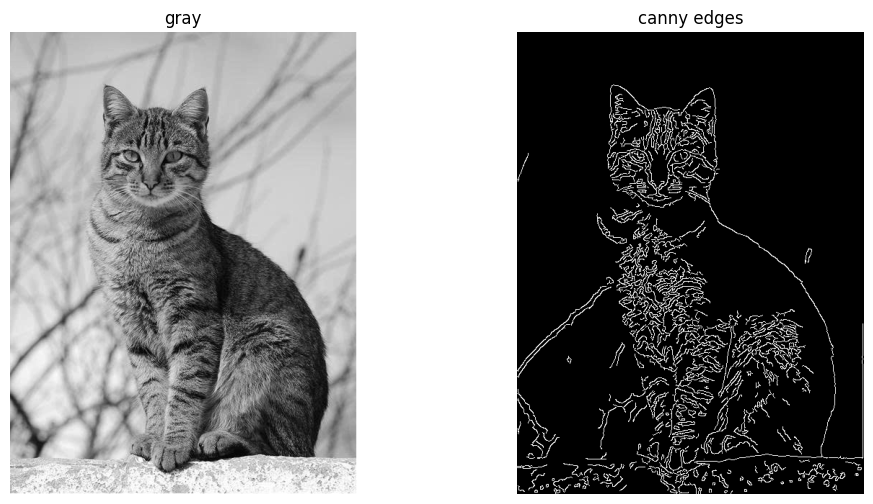

In [17]:
edges = cv2.Canny(blur_edge, 80, 160)
show_pair(gray_edge, edges, "gray", "canny edges", gray=True)

6) Hough transform (HoughLinesP)

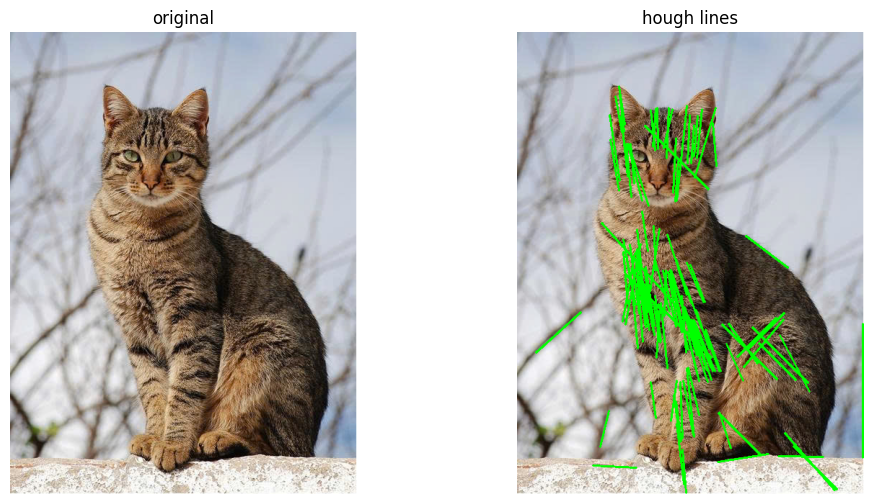

In [18]:
line_img = img_edge.copy()

lines = cv2.HoughLinesP(
    edges,
    rho=1,
    theta=np.pi/180,
    threshold=80,
    minLineLength=50,
    maxLineGap=10
)

if lines is not None:
    for x1, y1, x2, y2 in lines.reshape(-1, 4):
        cv2.line(line_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

show_pair(img_edge, line_img, "original", "hough lines")